# Semana 1 del curso intensivo de Cosmología  - CMB   --- ejercicios resueltos

Del 25 de marzo al 4 de abril de 2025 - DF-FCFyN-UBA

Prof. Claudia Scóccola
Departamento de Física, Facultad de Ciencias Físicas y Matemáticas, Universidad de Chile

---

## Práctica 1

---

#### Ejercicio 1

Explorar el tutorial CAMBdemo.ipynb para aprender cómo se utiliza el código para calcular los $C_ \ell$ y cómo se generan mapas a partir de estos espectros.

#### Ejercicio 2:

Elegir un conjunto de parámetros cosmológicos, y graficar los $C_\ell^{TT}$, $C_\ell^{EE}$, $C_\ell^{BB}$, $C_\ell^{TE}$. 

Notar que la salida de CAMB en realidad son los $D_\ell = \frac{\ell (\ell + 1)}{2 \pi} C_\ell$

In [19]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import sys, platform, os
import matplotlib
from matplotlib import pyplot as plt
import numpy as np
import camb
from camb import model, initialpower
print('Using CAMB %s installed at %s'%(camb.__version__,os.path.dirname(camb.__file__)))
# make sure the version and path is what you expect

Using CAMB 1.5.9 installed at /home/claudia-scoccola/miniconda3/envs/cosmo_env/lib/python3.10/site-packages/camb


In [20]:
#Set up a new set of parameters for CAMB
#The defaults give one massive neutrino and helium set using BBN consistency

# For example, from https://arxiv.org/pdf/2411.06000
# table IV, column 2 (Planck)

H0=      67.4    #67.5
ombh2=   0.0223  #0.022
omch2=   0.119   #0.122
mnu=     0.06    #0.06
omk=     0       #0
tau=     0.053   #0.0
As=      2.0947e-09 #2e-9
ns=       0.965 #0.965


pars = camb.set_params(H0=H0, ombh2=ombh2, omch2=omch2, mnu=mnu, omk=omk, tau=tau,  
                       As=As, ns=ns, halofit_version='mead', lmax=3000)


In [21]:
np.exp(3.042) * 1.e-10

np.float64(2.094709555993701e-09)

In [22]:
#calculate results for these parameters
results = camb.get_results(pars)

In [23]:
#get dictionary of CAMB power spectra
powers =results.get_cmb_power_spectra(pars, CMB_unit='muK')
for name in powers: print(name)

total
unlensed_scalar
unlensed_total
lensed_scalar
tensor
lens_potential


(3051, 4)


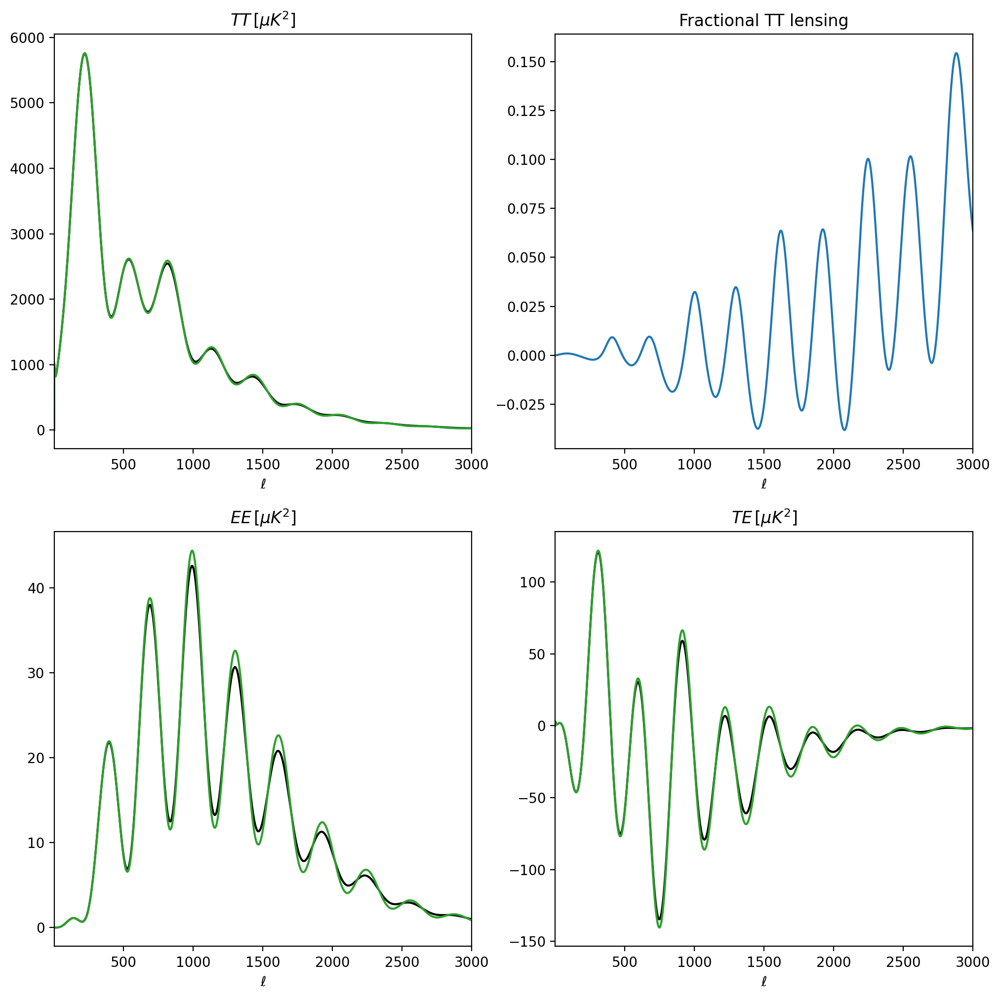

In [24]:
#plot the total lensed CMB power spectra versus unlensed, and fractional difference
totCL=powers['total']
unlensedCL=powers['unlensed_scalar']
print(totCL.shape)
#Python CL arrays are all zero based (starting at L=0), Note L=0,1 entries will be zero by default.
#The different CL are always in the order TT, EE, BB, TE (with BB=0 for unlensed scalar results).
ls = np.arange(totCL.shape[0])
fig, ax = plt.subplots(2,2, figsize = (12,12))
ax[0,0].plot(ls,totCL[:,0], color='k')
ax[0,0].plot(ls,unlensedCL[:,0], color='C2')
ax[0,0].set_title(r'$TT\, [\mu K^2]$')
ax[0,1].plot(ls[2:], 1-unlensedCL[2:,0]/totCL[2:,0]);
ax[0,1].set_title(r'Fractional TT lensing')
ax[1,0].plot(ls,totCL[:,1], color='k')
ax[1,0].plot(ls,unlensedCL[:,1], color='C2')
ax[1,0].set_title(r'$EE\, [\mu K^2]$')
ax[1,1].plot(ls,totCL[:,3], color='k')
ax[1,1].plot(ls,unlensedCL[:,3], color='C2')
ax[1,1].set_title(r'$TE\, [\mu K^2]$');
for ax in ax.reshape(-1): 
    ax.set_xlim([2,3000])
    ax.set_xlabel(r'$\ell$');

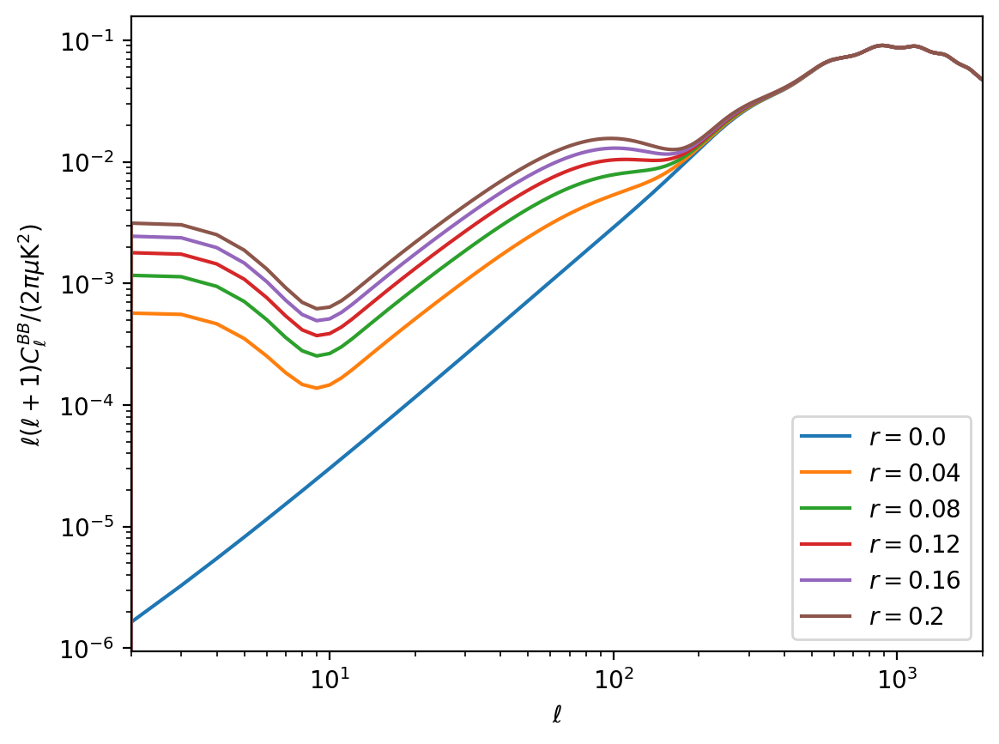

In [25]:
#You can calculate spectra for different primordial power spectra without recalculating everything
#for example, let's plot the BB spectra as a function of r
pars.set_for_lmax(4000, lens_potential_accuracy=1)
pars.WantTensors = True
results = camb.get_transfer_functions(pars)
lmax=2000
rs = np.linspace(0,0.2,6)
for r in rs:
    inflation_params = initialpower.InitialPowerLaw()
    inflation_params.set_params(ns=0.96, r=r)
    results.power_spectra_from_transfer(inflation_params) #warning OK here, not changing scalars
    cl = results.get_total_cls(lmax, CMB_unit='muK')
    plt.loglog(np.arange(lmax+1),cl[:,2])
plt.xlim([2,lmax])
plt.legend(["$r = %s$"%r for r in  rs], loc='lower right');
plt.ylabel(r'$\ell(\ell+1)C_\ell^{BB}/ (2\pi \mu{\rm K}^2)$')
plt.xlabel(r'$\ell$');

#### Ejercicio 3: 

Utilizando CAMB, crear una realización de mapas de CMB. Guarde el "seed" para poder reproducir la realización.


In [26]:
import healpy as hp

In [35]:
tot_dls = powers['total']
dl_tt = tot_dls[:, 0]
dl_ee = tot_dls[:, 1]
dl_bb = tot_dls[:, 2]
dl_te = tot_dls[:, 3]

# Recordar que CAMB devuelve los Dl. Y hp.synfast recibe los Cl, asi que hay que sacar el factor de normalización.
#Define factor as:

factor = np.arange(len(dl_tt)) * (np.arange(len(dl_tt)) + 1) / (2 * np.pi)

cl_tt[1:] = dl_tt[1:] / factor[1:]
cl_ee[1:] = dl_ee[1:] / factor[1:]
cl_bb[1:] = dl_bb[1:] / factor[1:]
cl_te[1:] = dl_te[1:] / factor[1:]


cls = [cl_tt, cl_ee, cl_bb, cl_te]

nside = 512  # Ajustar la resolución del mapa
lmax = len(cl_tt) - 1

In [36]:
# Fijar la semilla para reproducibilidad
seed = 42
np.random.seed(seed)

hp.synfast usa el generador de números aleatorios de numpy, lo que significa que toma los valores de la secuencia de números pseudoaleatorios que maneja numpy.

¿Cómo funciona internamente?
Cuando llamas a np.random.seed(seed), estás inicializando el generador de números aleatorios en un estado específico. Luego, cada vez que hp.synfast necesita un número aleatorio (por ejemplo, para generar los coeficientes $a_{lm}$ a partir de $C_\ell$), toma el siguiente número de la secuencia de numpy.

Cada llamada a hp.synfast consume varios de estos números pseudoaleatorios (dependiendo de la cantidad de multipolos y la resolución del mapa). Por eso, si no vuelves a fijar la semilla antes de cada ejecución, la siguiente llamada usará los números siguientes de la secuencia y generará un mapa diferente.

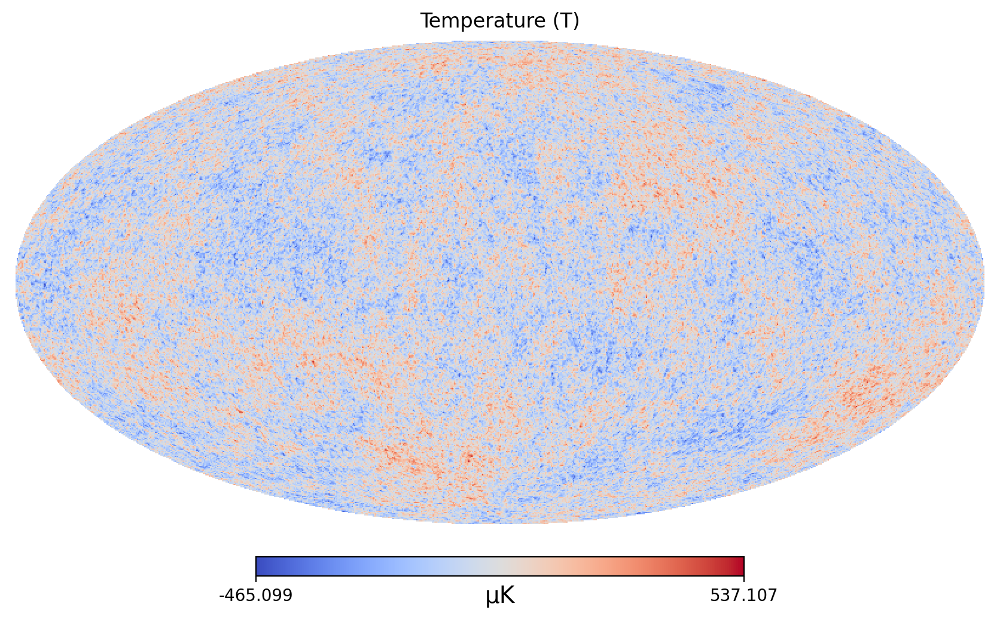

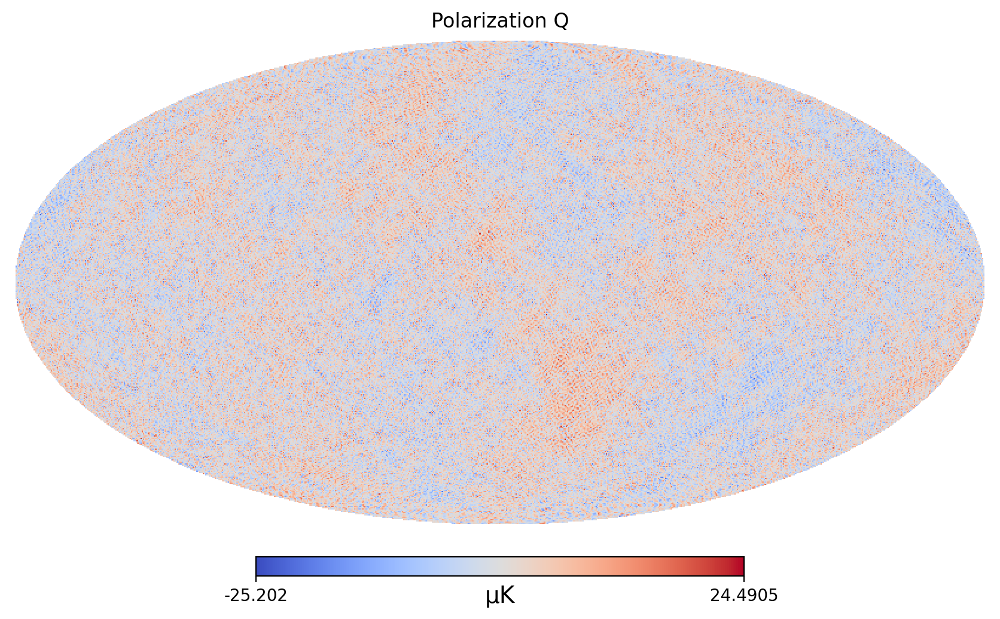

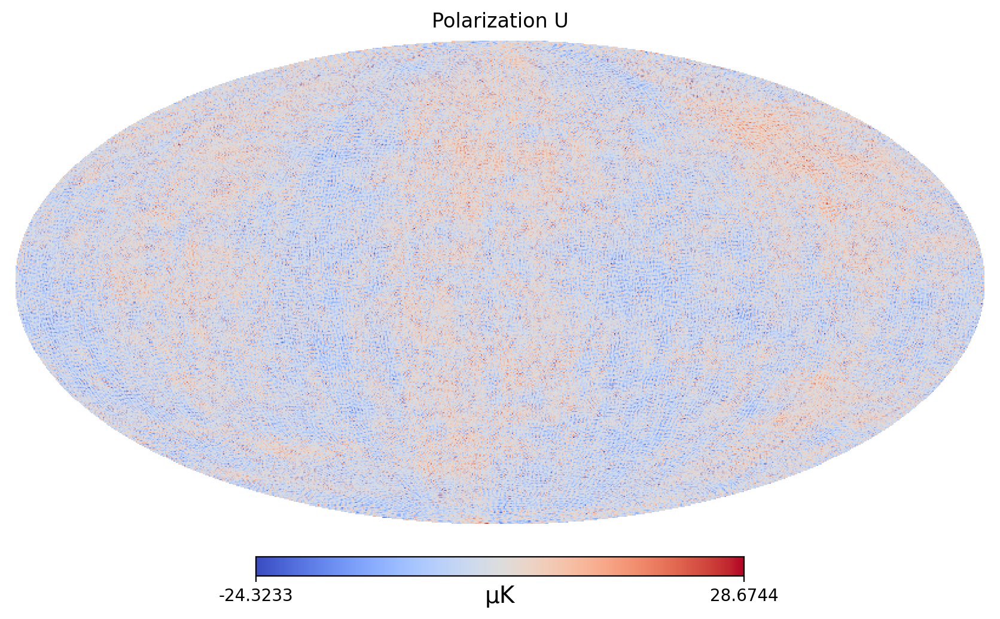

In [44]:
# Generar mapas de T, Q, U con hp.synfast
np.random.seed(seed)  #voy a querer siempre la misma semilla en este caso, porque quiero comparar el efecto del FWHM
cmb_map = hp.synfast(cls, nside, lmax=lmax, mmax=None, alm=False, pol=True, pixwin=False, fwhm=0., sigma=None, new=False)


# Visualizar los mapas
titles = ['Temperature (T)', 'Polarization Q', 'Polarization U']
for i in range(3):
    hp.mollview(cmb_map[i], title=titles[i], unit='μK', cmap='coolwarm')
#    plt.show()

#### Ejercicio 4:
Vuelva a crear la misma realización de mapas de CMB, pero esta vez, con un beam distinto de cero, simulando el efecto de la PSF (point spread function) de un telescopio.

Repita con un FWHM más grande.

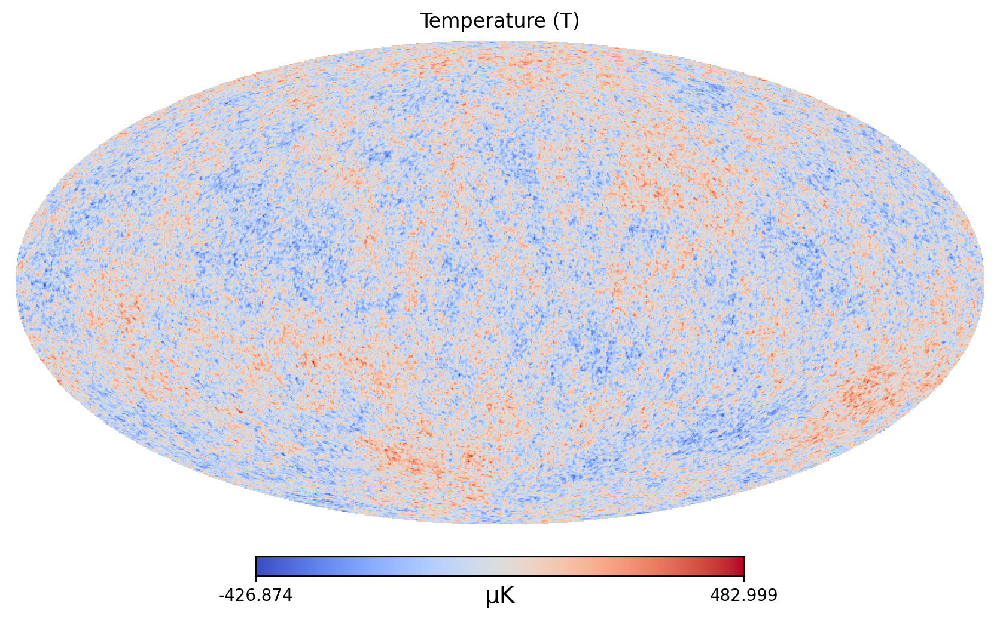

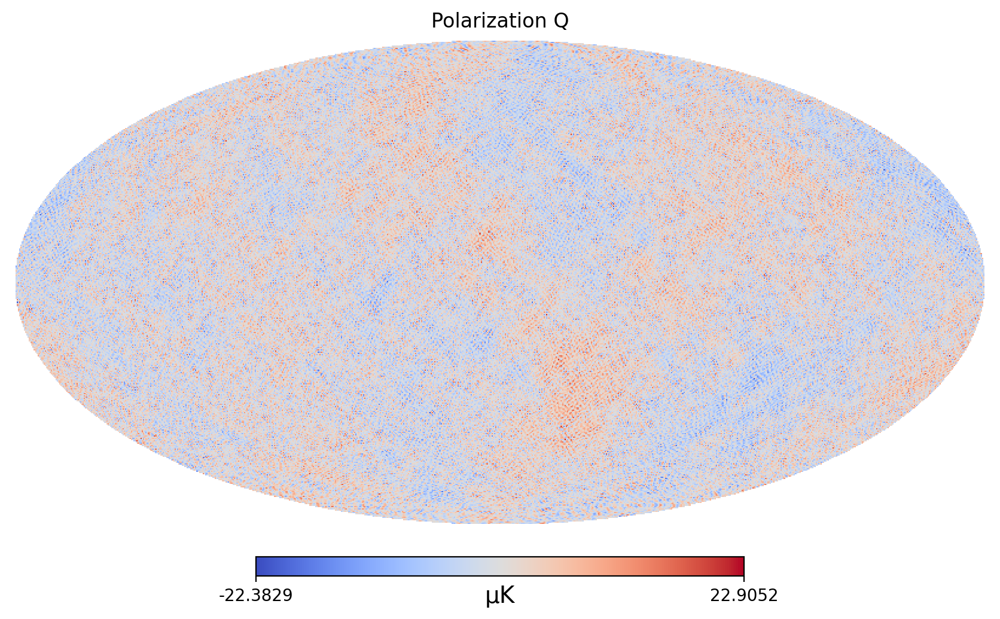

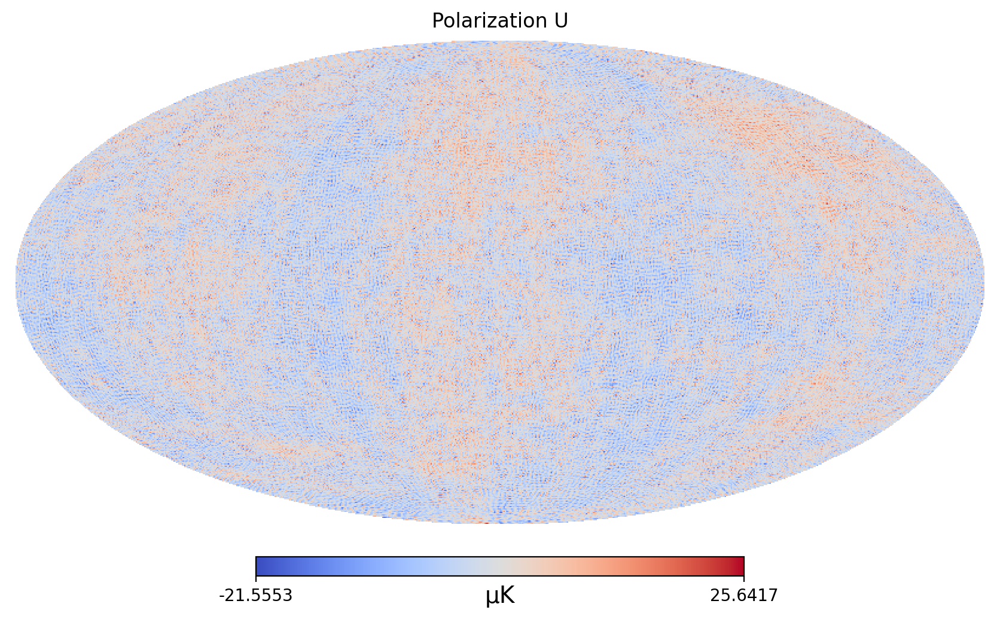

In [43]:
FWHM_test_arcmin = 10 #arcmin
FWHM_test = FWHM_test_arcmin  *np.pi /(180.*60.)

# Generar mapas de T, Q, U con hp.synfast
np.random.seed(seed)  #voy a querer siempre la misma semilla en este caso, porque quiero comparar el efecto del FWHM
cmb_map_10 = hp.synfast(cls, nside, lmax=lmax, mmax=None, alm=False, pol=True, pixwin=False, fwhm=FWHM_test, sigma=None, new=False)


# Visualizar los mapas
titles = ['Temperature (T)', 'Polarization Q', 'Polarization U']
for i in range(3):
    hp.mollview(cmb_map_10[i], title=titles[i], unit='μK', cmap='coolwarm')
#    plt.show()

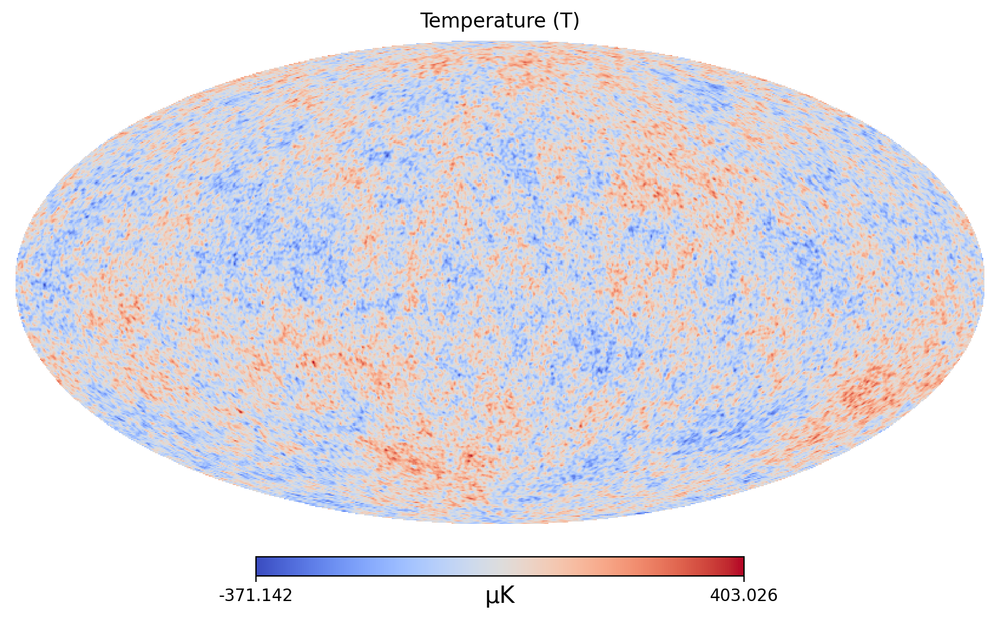

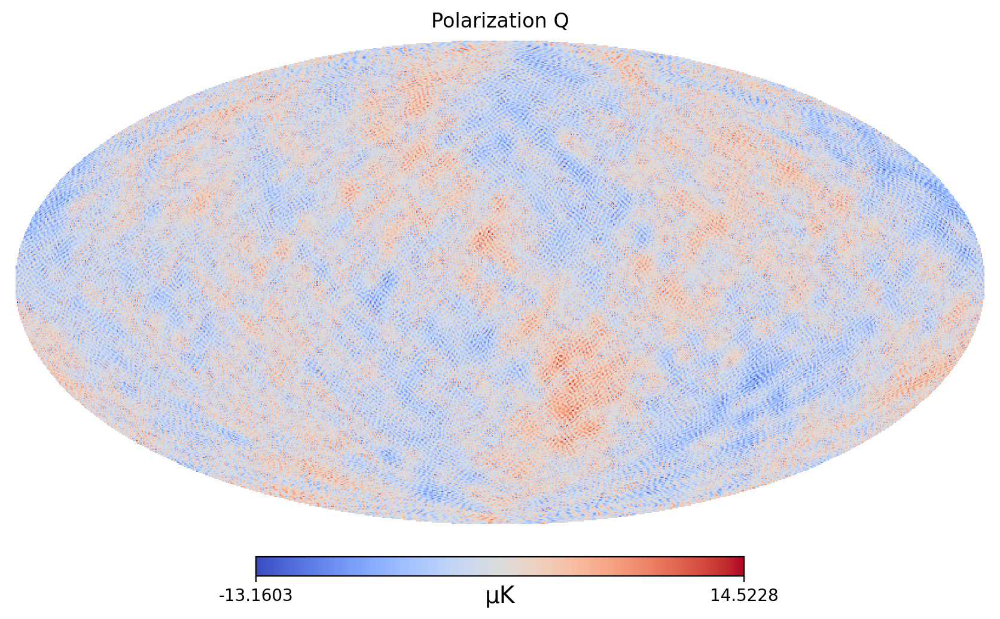

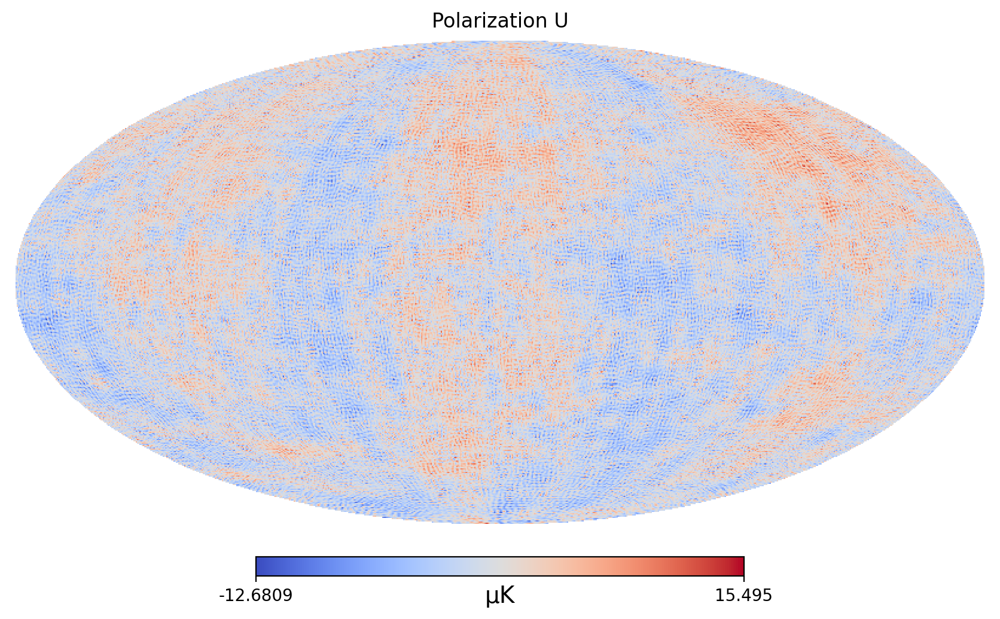

In [40]:

FWHM_test_arcmin = 30 #arcmin
FWHM_test = FWHM_test_arcmin  *np.pi /(180.*60.)

# Generar mapas de T, Q, U con hp.synfast
np.random.seed(seed)  #voy a querer siempre la misma semilla en este caso, porque quiero comparar el efecto del FWHM
cmb_map_30 = hp.synfast(cls, nside, lmax=lmax, mmax=None, alm=False, pol=True, pixwin=False, fwhm=FWHM_test, sigma=None, new=False)


# Visualizar los mapas
titles = ['Temperature (T)', 'Polarization Q', 'Polarization U']
for i in range(3):
    hp.mollview(cmb_map_30[i], title=titles[i], unit='μK', cmap='coolwarm')
#    plt.show()



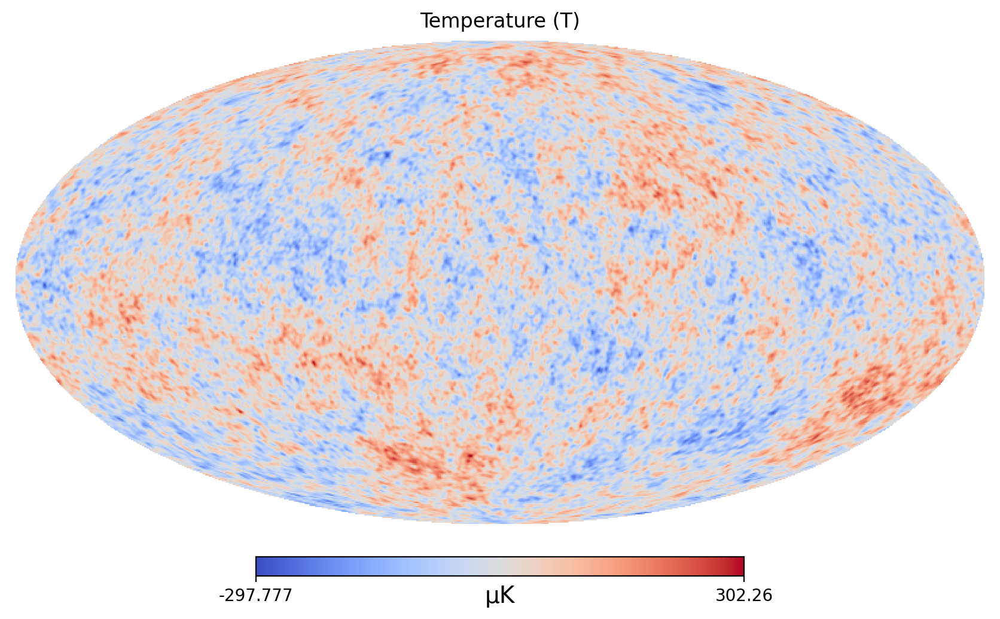

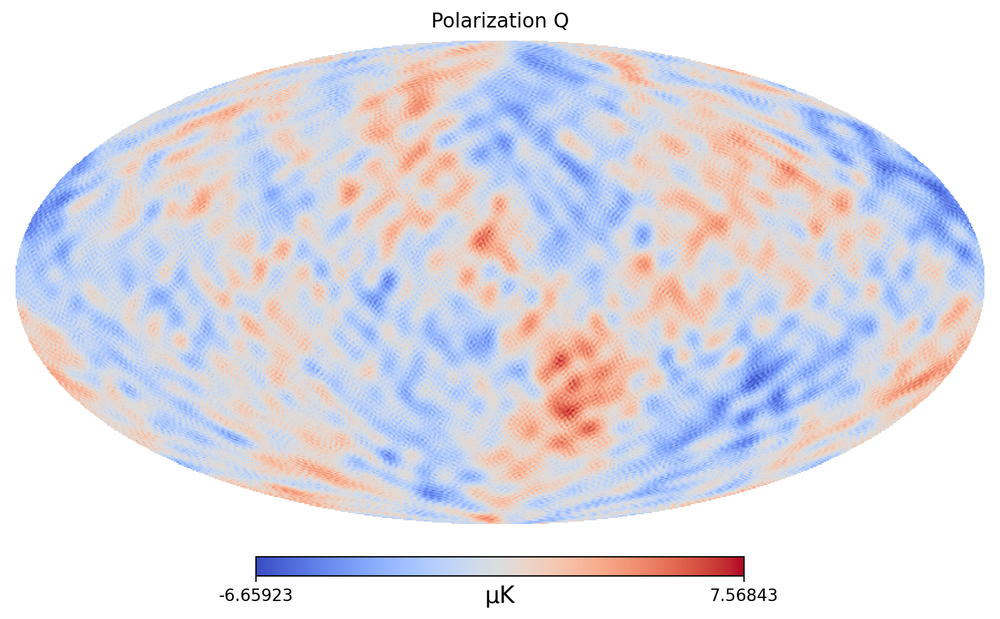

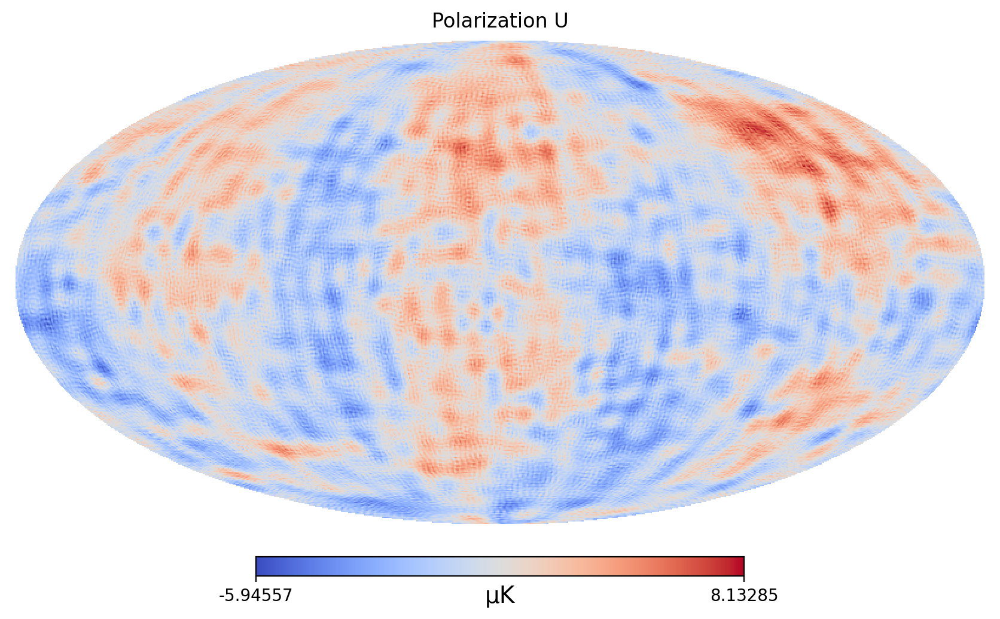

In [41]:

FWHM_test_arcmin = 60 #arcmin
FWHM_test = FWHM_test_arcmin  *np.pi /(180.*60.)

# Generar mapas de T, Q, U con hp.synfast
np.random.seed(seed)  #voy a querer siempre la misma semilla en este caso, porque quiero comparar el efecto del FWHM
cmb_map_60 = hp.synfast(cls, nside, lmax=lmax, mmax=None, alm=False, pol=True, pixwin=False, fwhm=FWHM_test, sigma=None, new=False)


# Visualizar los mapas
titles = ['Temperature (T)', 'Polarization Q', 'Polarization U']
for i in range(3):
    hp.mollview(cmb_map_60[i], title=titles[i], unit='μK', cmap='coolwarm')
#    plt.show()



#### Ejercicio 5:

Calcular el espectro a partir del mapa, tanto en el caso de FWHM = 0, como en el caso distinto de cero. En este último caso, aplicar la corrección por beam.

In [55]:
print(len(cl_tt), len(cl_fwhm0))

3051 1536



## En lo que sigue, revisar el lmax

y encontrar por qué da distinto de lo que tendria que dar.

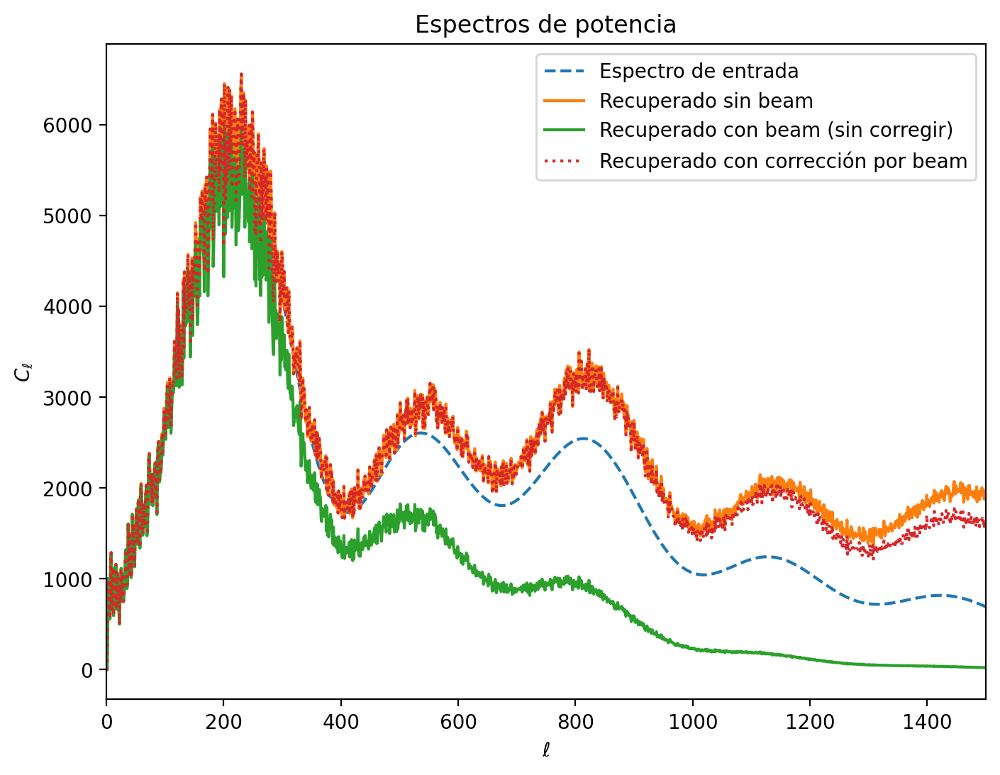

In [59]:
# Calcular el espectro sin corrección (FWHM = 0)

#Solo para efectos ilustrativos, trabajamos con el mapa de temperatura solamente:


##Mapa con FWHM=0.
map_fwhm0 = cmb_map[0]
cl_fwhm0 = hp.anafast(map_fwhm0)

#ell = np.arange(len(cl_fwhm0))
#ls = np.arange(totCL.shape[0])

lmax = len(cl_fwhm0) -1

# Caso con beam: FWHM > 0 (FWHM = 10 arcmin)
fwhm_arcmin = 10  # FWHM en minutos de arco
fwhm_rad = np.radians(fwhm_arcmin / 60)  # Convertir a radianes

##Mapa con FWHM=10. (ya lo teníamos guardado)
map_fwhm_10 = cmb_map_10[0]
cl_fwhm_10 = hp.anafast(map_fwhm_10)

# Calcular la función de ventana del beam
beam_window_10 = hp.gauss_beam(fwhm=fwhm_rad, lmax=lmax)

# Corregir el espectro dividiendo por B_ell^2
cl_corrected = cl_fwhm_10 / beam_window_10**2


# Función de ventana del píxel
pixel_window = hp.pixwin(nside, lmax=lmax)

# Aplicar corrección por pixel al espectro sin beam
cl_fwhm0_corrected = cl_fwhm0 / pixel_window**2

# Aplicar corrección por pixel al caso con FWHM=10 (ya corregido por beam)
cl_corrected = cl_corrected / pixel_window**2


# Calculo el factor para poder graficar los D_\ell

factor = np.arange(len(cl_fwhm0)) * (np.arange(len(cl_fwhm0)) + 1) / (2 * np.pi)


plt.figure(figsize=(8,6))
plt.plot(ls, dl_tt, label="Espectro de entrada", linestyle="dashed")
plt.plot(ell, factor*cl_fwhm0_corrected, label="Recuperado sin beam")
plt.plot(ell, factor*cl_fwhm_10, label="Recuperado con beam (sin corregir)")
plt.plot(ell, factor*cl_corrected, label="Recuperado con corrección por beam", linestyle="dotted")

#plt.yscale("log")
plt.xlabel(r"$\ell$")
plt.ylabel(r"$C_\ell$")
plt.xlim(0, 1500)
plt.legend()
plt.title("Espectros de potencia")
plt.show()


## Se puede pedir ayudar en todas las funciones. Por ejemplo, para hp.synalm, o hp.synfast: 

In [21]:
#hp.synalm([cl_tt, cl_ee, cl_bb, cl_te], new=True, lmax=lmax)

hp.synalm?

Signature: hp.synalm(cls, lmax=None, mmax=None, new=False, verbose=True)
Docstring:
Generate a set of alm given cl.
The cl are given as a float array. Corresponding alm are generated.
If lmax is None, it is assumed lmax=cl.size-1
If mmax is None, it is assumed mmax=lmax.

Parameters
----------
cls : float, array or tuple of arrays
  Either one cl (1D array) or a tuple of either 4 cl
  or of n*(n+1)/2 cl.
  Some of the cl may be None, implying no
  cross-correlation. See *new* parameter.
lmax : int, scalar, optional
  The lmax (if None or <0, the largest size-1 of cls)
mmax : int, scalar, optional
  The mmax (if None or <0, =lmax)
new : bool, optional
  If True, use the new ordering of cl's, ie by diagonal
  (e.g. TT, EE, BB, TE, EB, TB or TT, EE, BB, TE if 4 cl as input).
  If False, use the old ordering, ie by row
  (e.g. TT, TE, TB, EE, EB, BB or TT, TE, EE, BB if 4 cl as input).

Returns
-------
alms : array or list of arrays
  the generated alm if one spectrum is given, or a list o

In [23]:
hp.synfast?

Signature:
hp.synfast(
    cls,
    nside,
    lmax=None,
    mmax=None,
    alm=False,
    pol=True,
    pixwin=False,
    fwhm=0.0,
    sigma=None,
    new=False,
    verbose=True,
)
Docstring:
Create a map(s) from cl(s).

You can choose a random seed using `numpy.random.seed(SEEDVALUE)`
before calling `synfast`.

Parameters
----------
cls : array or tuple of array
  A cl or a list of cl (either 4 or 6, see :func:`synalm`)
nside : int, scalar
  The nside of the output map(s)
lmax : int, scalar, optional
  Maximum l for alm. Default: min of 3*nside-1 or length of the cls - 1
mmax : int, scalar, optional
  Maximum m for alm.
alm : bool, scalar, optional
  If True, return also alm(s). Default: False.
pol : bool, optional
  If True, assumes input cls are TEB and correlation. Output will be TQU maps.
  (input must be 1, 4 or 6 cl's)
  If False, fields are assumed to be described by spin 0 spherical harmonics.
  (input can be any number of cl's)
  If there is only one input cl, it has no e

In [51]:
hp.anafast?

Signature:
hp.anafast(
    map1,
    map2=None,
    nspec=None,
    lmax=None,
    mmax=None,
    iter=3,
    alm=False,
    pol=True,
    use_weights=False,
    datapath=None,
    gal_cut=0,
    use_pixel_weights=False,
)
Docstring:
Computes the power spectrum of a Healpix map, or the cross-spectrum
between two maps if *map2* is given.
No removal of monopole or dipole is performed. The input maps must be
in ring-ordering.
Spherical harmonics transforms in HEALPix are always on the full sky,
if the map is masked, those pixels are set to 0. It is recommended to
remove monopole from the map before running `anafast` to reduce
boundary effects.

For recommendations about how to set `lmax`, `iter`, and weights, see the
`Anafast documentation <https://healpix.sourceforge.io/html/fac_anafast.htm>`_

Parameters
----------
map1 : float, array-like shape (Npix,) or (3, Npix)
  Either an array representing a map, or a sequence of 3 arrays
  representing I, Q, U maps. Must be in ring ordering.
map